# Plot vertex-wise SC

In [1]:
# Set the environment
import os
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
from brainspace.plotting import plot_hemispheres
from brainspace.mesh.mesh_io import read_surface
from brainspace.datasets import load_conte69
from brainspace.utils.parcellation import map_to_labels
from brainspace.gradient import GradientMaps

In [10]:
def load_sc(File):
    """Loads and process a functional connectome"""
    
    # load the matrix
    mtx_sc = np.loadtxt(File, dtype=float, delimiter=' ')
    
    # Mirror the matrix
    #mtx_sc = np.log(np.triu(mtx_sc,1)+mtx_sc.T)
    print('Total number of streamlines:' + str(np.sum(mtx_sc)))
    mtx_sc = np.triu(mtx_sc,1)+mtx_sc.T
    mtx_sc[np.isneginf(mtx_sc)] = 0
    
    # replace 0 values with almost 0
    #mtx_sc[mtx_sc==0] = np.finfo(float).eps
    
    return mtx_sc

def plot_connectome(mtx):
    '''
    This optional function, only plots a connectome as a heatmap

    Parameters
    ----------
    mtx : np.array

    Returns
    -------
    f : plot

    '''
    f, ax = plt.subplots(figsize=(15,10))
    g = sns.heatmap(mtx, ax=ax)
    g.set_xlabel('ROI')
    g.set_ylabel('ROI')
    g.set_title('Connectome')


In [11]:
# Set the working directory to the 'out' directory
os.chdir('/data_/mica3/BIDS_MICs/fsLR_5k/results/SC/sub-HC007')

# Native surface
mid_lh = read_surface('sub-HC007_ses-01_space-conte69-5k_desc-lh_midthickness.surf.gii', itype='gii')
mid_rh = read_surface('sub-HC007_ses-01_space-conte69-5k_desc-rh_midthickness.surf.gii', itype='gii')

gm_lh = read_surface('sub-HC007_ses-01_space-conte69-5k_desc-lh_pial.surf.gii', itype='gii')
gm_rh = read_surface('sub-HC007_ses-01_space-conte69-5k_desc-rh_pial.surf.gii', itype='gii')


# Canonical surface
lh = read_surface('/data_/mica3/BIDS_MICs/fsLR_5k/surface/fsLR_5k-regular.L.surf.gii', itype='gii')
rh = read_surface('/data_/mica3/BIDS_MICs/fsLR_5k/surface/fsLR_5k-regular.R.surf.gii', itype='gii')

In [12]:
mtx = load_sc('sub-HC007_ses-01_space-dwi_atlas-fsRL5k_desc-iFOD2-100M-SIFT2_cor-connectome.txt')

Total number of streamlines:52768641.9558837


(array([6.711e+03, 2.123e+03, 5.840e+02, 1.660e+02, 5.100e+01, 2.700e+01,
        1.300e+01, 8.000e+00, 0.000e+00, 1.000e+00]),
 array([     0.       ,  12485.7343797,  24971.4687594,  37457.2031391,
         49942.9375188,  62428.6718985,  74914.4062782,  87400.1406579,
         99885.8750376, 112371.6094173, 124857.343797 ]),
 <BarContainer object of 10 artists>)

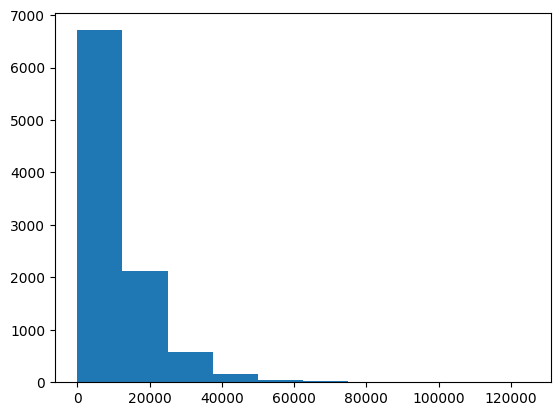

In [15]:
# Histogram of the nodal Strength from the raw connectome
Smtx = np.sum(mtx, axis=1)
plt.hist(Smtx)

/host/yeatman/local_raid/temporaryLocalProcessing/ipykernel_17053/1539419526.py:1: RuntimeWarning: divide by zero encountered in log
  Smtx_log = np.log(Smtx)


(array([ 923.,    5.,    8.,    9.,   24.,   79.,  744., 4286., 3319.,
         287.]),
 array([-0.529178  ,  0.69723251,  1.92364302,  3.15005353,  4.37646404,
         5.60287456,  6.82928507,  8.05569558,  9.28210609, 10.5085166 ,
        11.73492711]),
 <BarContainer object of 10 artists>)

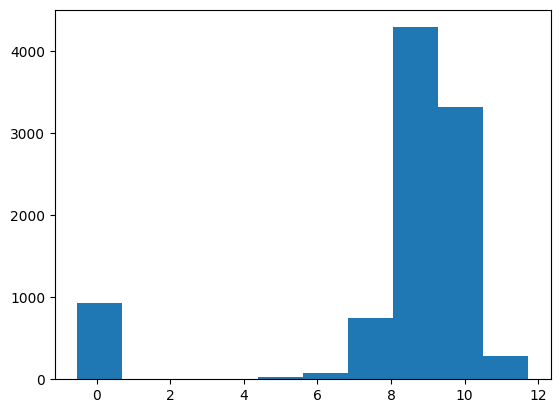

In [16]:
Smtx_log = np.log(Smtx)
Smtx_log[np.isneginf(Smtx_log)] = 0
plt.hist(Smtx_log)

/host/yeatman/local_raid/temporaryLocalProcessing/ipykernel_36652/3855121898.py:1: RuntimeWarning: divide by zero encountered in log
  plot_connectome(np.log(mtx))


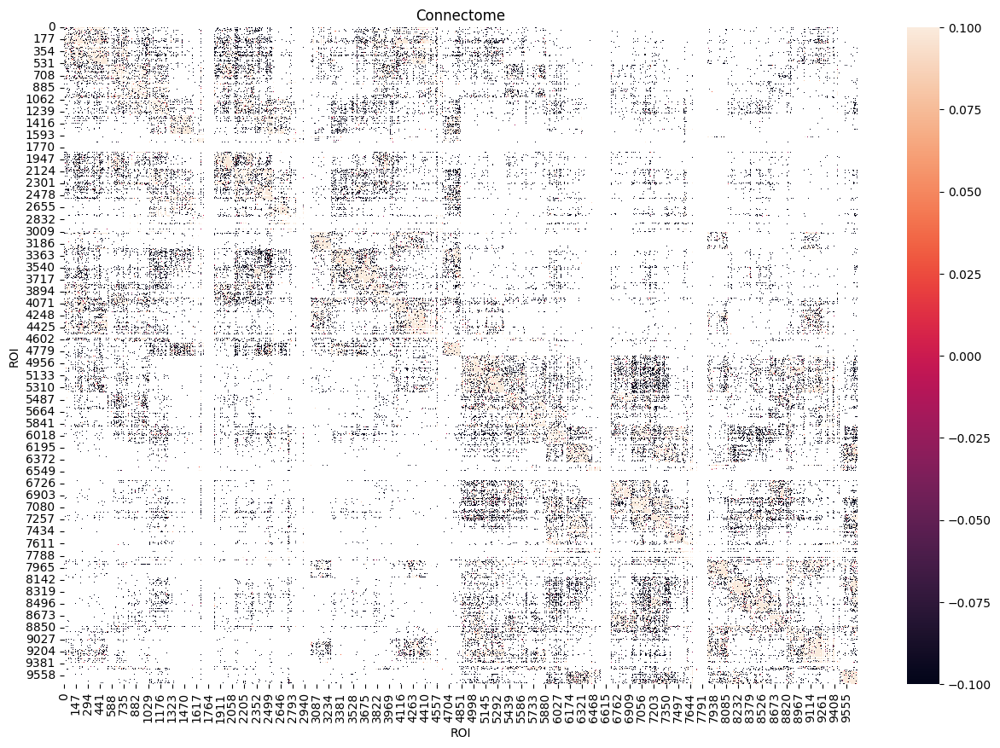

In [10]:
plot_connectome(np.log(mtx))

## Strength of the log matrix

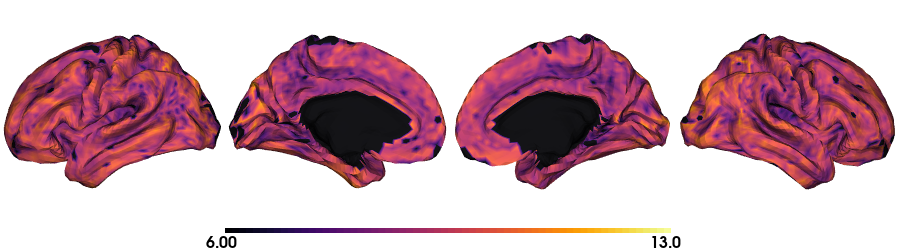

In [34]:
# Check if i need to map to labels: map_to_labels(Smtx_log, labels_fsRL5k,  fill=np.nan)
plot_hemispheres(lh, rh, array_name=Smtx_log, size=(900, 250), color_bar='bottom', zoom=1.25, embed_nb=True, interactive=False, share='both',
                         nan_color=(0, 0, 0, 1), cmap="inferno", transparent_bg=False, color_range=(6, 13),)

## Strength of the matrix

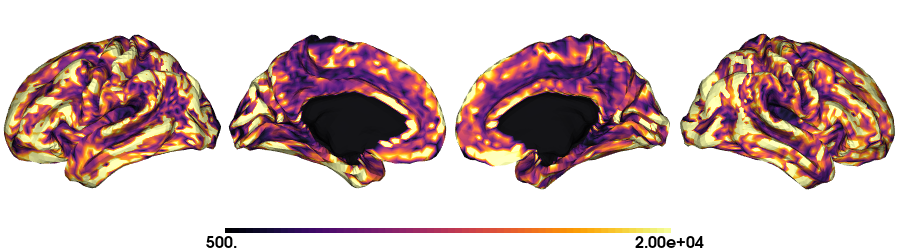

In [38]:
plot_hemispheres(lh, rh, array_name=Smtx, size=(900, 250), color_bar='bottom', zoom=1.25, embed_nb=True, interactive=False, share='both',
                         nan_color=(0, 0, 0, 1), color_range=(500, 20000), cmap="inferno", transparent_bg=False)

# Multiple SC densities (streamlines: 10M, 40M, 100M)

In [39]:
# Loads 10M SC
mtx10M = load_sc('sub-HC007_ses-01_space-dwi_atlas-fsRL5k_desc-iFOD2-10M-SIFT2_cor-connectome.txt')
# Loads 40M SC
mtx40M = load_sc('sub-HC007_ses-01_space-dwi_atlas-fsRL5k_desc-iFOD2-40M-SIFT2_cor-connectome.txt')
# Loads 100M SC
mtx100M = load_sc('sub-HC007_ses-01_space-dwi_atlas-fsRL5k_desc-iFOD2-100M-SIFT2_cor-connectome.txt')

Total number of streamlines:5352928.855465206
Total number of streamlines:21600588.674125716
Total number of streamlines:52768641.9558837


In [40]:
def plot_sc_strength(SC, Range=(7.5, 10)):
    """This function will plot the Strength of the SC by colum in log format"""
    
    # Calculate the strenght from the raw SC by column
    SC_S = np.sum(SC, axis=1)
    # Log transform the Strength
    SC_Slog = np.log(SC_S)
    # Replace negative infinite with 0
    SC_Slog[np.isneginf(SC_Slog)] = 0
    # Feature surface plot
    f = plot_hemispheres(lh, rh, array_name=SC_Slog, size=(900, 250), color_bar='bottom', zoom=1.25, embed_nb=True, 
                 interactive=False, share='both', nan_color=(0, 0, 0, 1), color_range=Range, 
                 cmap="inferno", transparent_bg=False)
    return(f)

def plot_sc_gradients(SC, N=5, scatter3d=False):
    """This function calculates and plot N gradients derived from the SC"""
    # log transform the connectome  
    SC_log = np.log(SC)
    # Replace negative infinite with 0
    SC_log[np.isneginf(SC_log)] = 0
    # replace 0 values with almost 0
    SC_log[SC_log==0] = np.finfo(float).eps
    
    # SC Left hemi
    SC_L = GradientMaps(n_components=N, random_state=None, approach='dm', kernel='normalized_angle')
    SC_L.fit(SC_log[0:4842, 0:4842], sparsity=0)

    # SC Right hemi
    SC_R = GradientMaps(n_components=N, alignment='procrustes', kernel='normalized_angle'); # align right hemi to left hemi
    SC_R.fit(SC_log[4842:9684, 4842:9684], sparsity=0, reference=SC_L.gradients_)
    
    if scatter3d==True:
        # plot the left gradients
        g1=SC_L.gradients_[:, 0]
        g2=SC_L.gradients_[:, 1]
        g3=SC_L.gradients_[:, 2]
        # plot the right gradients
        g1R=SC_R.aligned_[:, 0]
        g2R=SC_R.aligned_[:, 1]
        g3R=SC_R.aligned_[:, 2]

        # Creating figure
        fig = plt.subplots(1, 2, figsize = (7, 5))
        ax = plt.axes(projection ="3d")

        # Creating plot
        ax.scatter3D(g1, g2, g3, color = 'purple')
        ax.scatter3D(g1R, g2R, g3R, color = 'slateblue', marker='v')
        plt.title("Structural gradient")
        ax.legend(['Left SC', 'Right SC'])
        ax.set_xlabel('Grad 1')
        ax.set_ylabel('Grad 2')
        ax.set_zlabel('Grad 3')

        # show plot
        plt.show()
        
    # Left and right gradients concatenated
    SC_gradients = np.concatenate((SC_L.gradients_, SC_R.aligned_), axis=0)

    # Map gradients to original parcels
    grad = [None] * N
    for i, g in enumerate(SC_gradients.T[0:N,:]):
        grad[i] = g*mask_fsRL10k

    # Plot Gradients
    labels=['G'+str(x) for x in list(range(1,N+1))]
    f = plot_hemispheres(lh, rh, array_name=grad, size=(1000, 600), cmap='coolwarm',
                     embed_nb=True,  label_text={'left':labels}, color_bar='left',
                     zoom=1.25, nan_color=(1, 1, 1, 1))
    return(f)

## SC trength 10M streamlines

/host/yeatman/local_raid/temporaryLocalProcessing/ipykernel_17053/4180035971.py:7: RuntimeWarning: divide by zero encountered in log
  SC_Slog = np.log(SC_S)


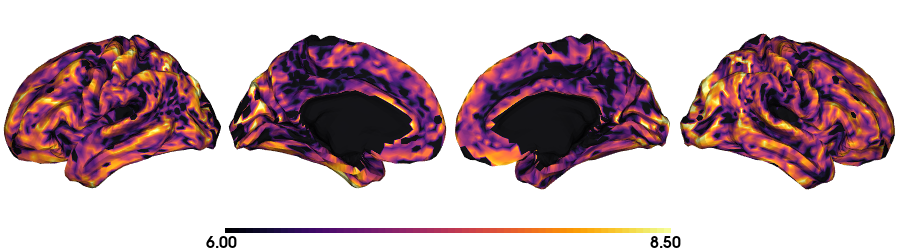

In [41]:
plot_sc_strength(mtx10M, Range=(6,8.5))

## SC trength 40M streamlines¶

/host/yeatman/local_raid/temporaryLocalProcessing/ipykernel_17053/4180035971.py:7: RuntimeWarning: divide by zero encountered in log
  SC_Slog = np.log(SC_S)


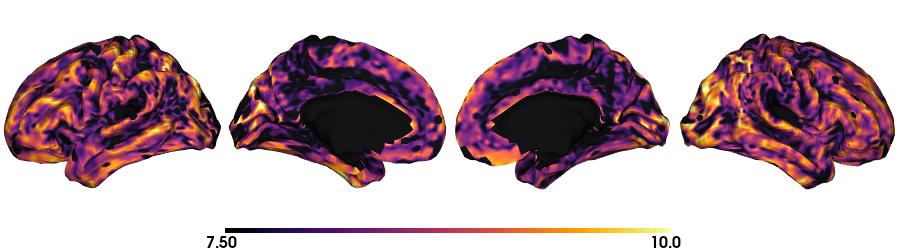

In [42]:
plot_sc_strength(mtx40M, Range=(7.5, 10))

## SC strength 100M streamlines

/host/yeatman/local_raid/temporaryLocalProcessing/ipykernel_17053/4180035971.py:7: RuntimeWarning: divide by zero encountered in log
  SC_Slog = np.log(SC_S)


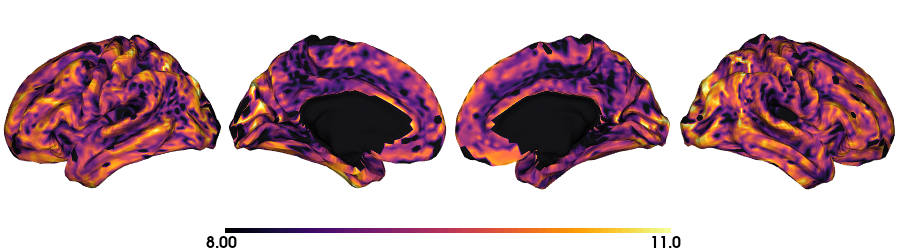

In [43]:
plot_sc_strength(mtx100M, Range=(8, 11))

# Vertex-wise structural connectome gradients

In [45]:
# Load the mask of the medial wall
mask_lh = np.loadtxt('/data_/mica3/BIDS_MICs/fsLR_5k/surface/deformed_mask_5k_lh.txt')
mask_rh = np.loadtxt('/data_/mica3/BIDS_MICs/fsLR_5k/surface/deformed_mask_5k_rh.txt')
mask_fsRL10k = np.concatenate((mask_lh, mask_rh), axis=0)

# Labels and boolean mask
labels_fsRL10k = np.array(range(mask_fsRL10k.shape[0]))
mask = mask_fsRL10k != 0

/host/yeatman/local_raid/temporaryLocalProcessing/ipykernel_17053/4180035971.py:19: RuntimeWarning: divide by zero encountered in log
  SC_log = np.log(SC)


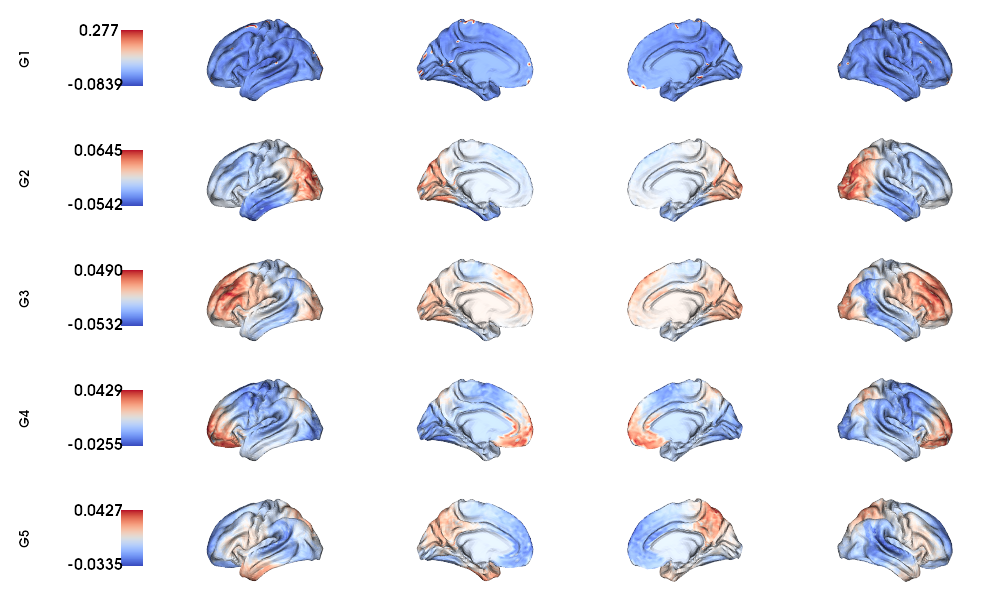

In [46]:
plot_sc_gradients(mtx10M, N=5)

/host/yeatman/local_raid/temporaryLocalProcessing/ipykernel_36652/4180035971.py:19: RuntimeWarning: divide by zero encountered in log
  SC_log = np.log(SC)


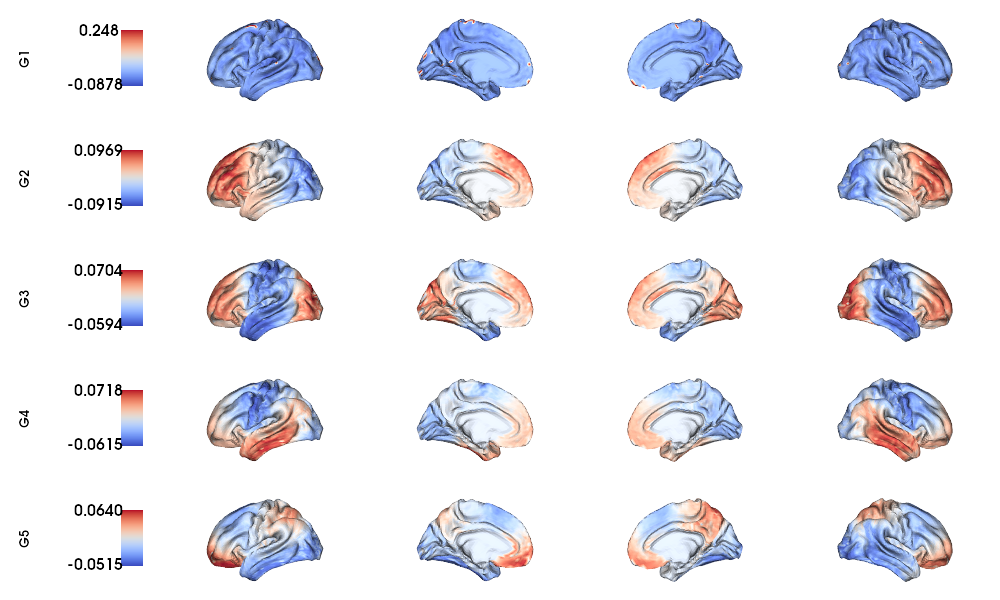

In [29]:
plot_sc_gradients(mtx40M, N=5)

/host/yeatman/local_raid/temporaryLocalProcessing/ipykernel_36652/4180035971.py:19: RuntimeWarning: divide by zero encountered in log
  SC_log = np.log(SC)


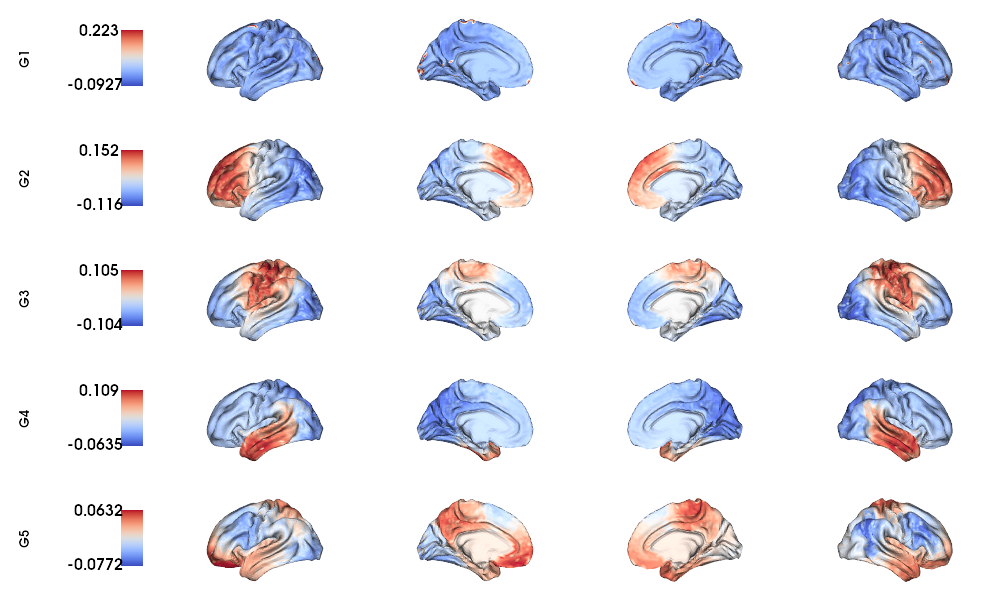

In [31]:
plot_sc_gradients(mtx100M, N=5)

# Gradients excluding the medial wall

In [41]:
# Get the index of the non medial wall regions
indx = np.where(mask_fsRL10k==1)[0]

# Slice the matrix
mtx100M_masked = mtx100M[indx, :]
mtx100M_masked = mtx100M_masked[:, indx]

# log transform the connectome  
SC_log = np.log(mtx100M_masked)

# Replace negative infinite with 0
SC_log[np.isneginf(SC_log)] = 0

# replace 0 values with almost 0
SC_log[SC_log==0] = np.finfo(float).eps

/host/yeatman/local_raid/temporaryLocalProcessing/ipykernel_36652/1251231916.py:9: RuntimeWarning: divide by zero encountered in log
  SC_log = np.log(mtx100M_masked)


In [42]:
# Should FIX the symmetric issue of the mask/spheres
print(np.where(mask_lh==1)[0].shape)
print(np.where(mask_rh==1)[0].shape)
SC_log.shape

(4428,)
(4428,)


(8856, 8856)

# Alinged gradients Left-Right

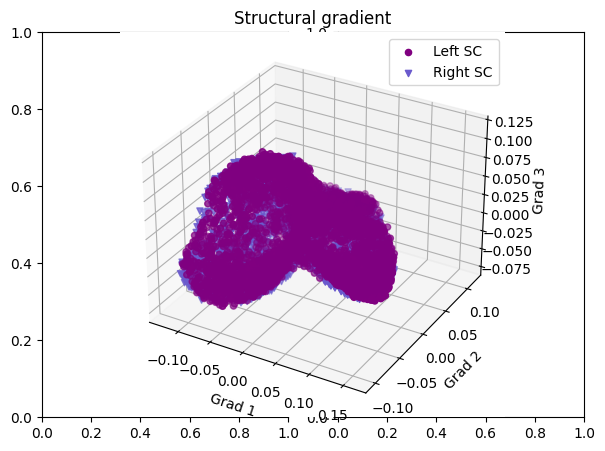

In [52]:
# Number of components
N = 5

# SC Left hemi
SC_L = GradientMaps(n_components=N, random_state=None, approach='dm', kernel='normalized_angle')
SC_L.fit(SC_log[0:4428, 0:4428], sparsity=0)

# SC Right hemi
SC_R = GradientMaps(n_components=N, alignment='procrustes', kernel='normalized_angle'); # align right hemi to left hemi
SC_R.fit(SC_log[4428:8856, 4428:8856], sparsity=0, reference=SC_L.gradients_)

# plot the left gradients
g1=SC_L.gradients_[:, 0]
g2=SC_L.gradients_[:, 1]
g3=SC_L.gradients_[:, 2]
# plot the right gradients
g1R=SC_R.aligned_[:, 0]
g2R=SC_R.aligned_[:, 1]
g3R=SC_R.aligned_[:, 2]

# Creating figure
fig = plt.subplots(1, 2, figsize = (7, 5))
ax = plt.axes(projection ="3d")

# Creating plot
ax.scatter3D(g1, g2, g3, color = 'purple')
ax.scatter3D(g1R, g2R, g3R, color = 'slateblue', marker='v')
plt.title("Structural gradient")
ax.legend(['Left SC', 'Right SC'])
ax.set_xlabel('Grad 1')
ax.set_ylabel('Grad 2')
ax.set_zlabel('Grad 3')

# show plot
plt.show()

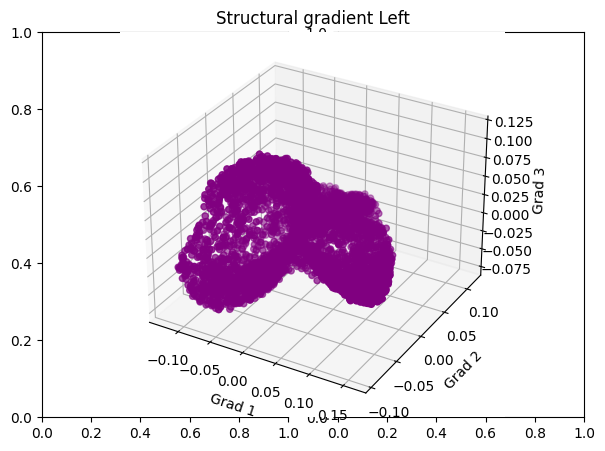

In [53]:
# Creating figure
fig = plt.subplots(1, 2, figsize = (7, 5))
ax = plt.axes(projection ="3d")

# Creating plot
ax.scatter3D(g1, g2, g3, color = 'purple')
plt.title("Structural gradient Left")
ax.set_xlabel('Grad 1')
ax.set_ylabel('Grad 2')
ax.set_zlabel('Grad 3')

# show plot
plt.show()

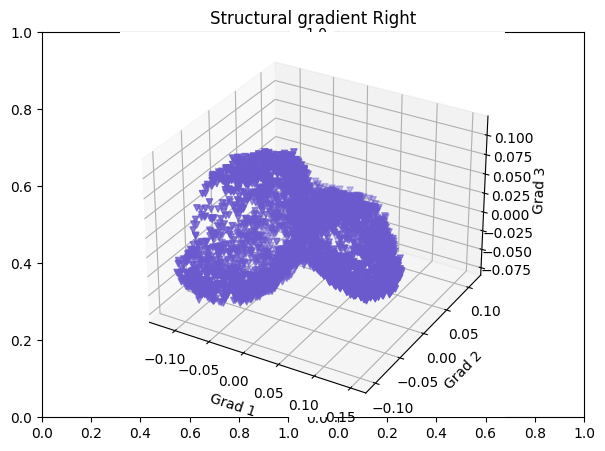

In [54]:
# Creating figure
fig = plt.subplots(1, 2, figsize = (7, 5))
ax = plt.axes(projection ="3d")

# Creating plot
ax.scatter3D(g1R, g2R, g3R, color = 'slateblue', marker='v')
plt.title("Structural gradient Right")
ax.set_xlabel('Grad 1')
ax.set_ylabel('Grad 2')
ax.set_zlabel('Grad 3')

# show plot
plt.show()

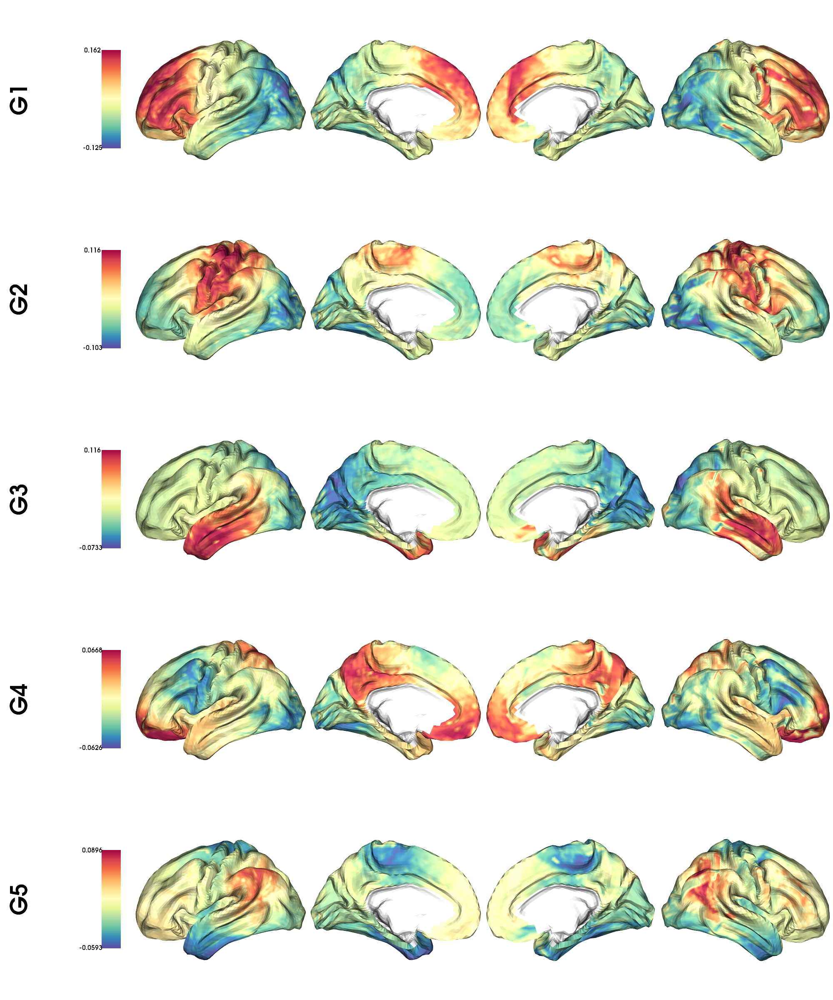

In [60]:
# Left and right gradients concatenated
SC_gradients = np.concatenate((SC_L.gradients_, np.zeros((3, N)), SC_R.aligned_), axis=0)

# Map gradients to original parcels
grad = [None] * N
for i, g in enumerate(SC_gradients.T[0:N,:]):
    grad[i] = map_to_labels(g, labels_fsRL10k, fill=np.nan, mask=mask)

# Plot Gradients
# Spectral_r coolwarm
labels=['G'+str(x) for x in list(range(1,N+1))]
plot_hemispheres(lh, rh, array_name=grad, size=(2000, 2400), cmap='Spectral_r',
                     embed_nb=True,  label_text={'left':labels}, color_bar='left',
                     zoom=1.25, nan_color=(1, 1, 1, 1), screenshot=False, filename='/home/bic/rcruces/Desktop/grad_100M_masked.png')


# Vertex-wise SC gradients (NO left to right alignment)

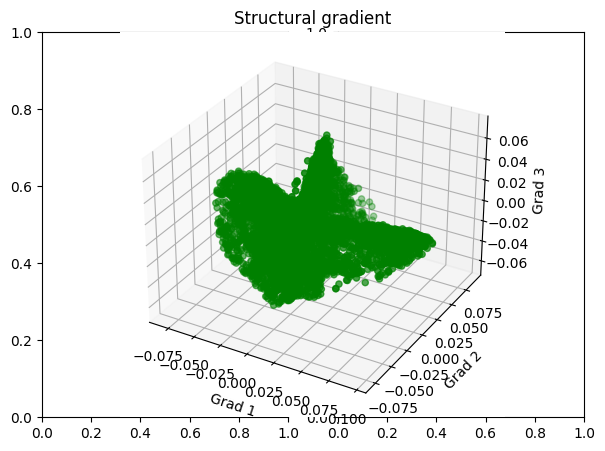

In [63]:
# Number of componetnts
N = 5

# SC Left hemi
SC_full = GradientMaps(n_components=N, random_state=None, approach='dm', kernel='normalized_angle')
SC_full.fit(SC_log, sparsity=0)

# plot the left gradients
g1=SC_full.gradients_[:, 0]
g2=SC_full.gradients_[:, 1]
g3=SC_full.gradients_[:, 2]

# Creating figure
fig = plt.subplots(1, 2, figsize = (7, 5))
ax = plt.axes(projection ="3d")

# Creating plot
ax.scatter3D(g1, g2, g3, color = 'green')
plt.title("Structural gradient")
ax.set_xlabel('Grad 1')
ax.set_ylabel('Grad 2')
ax.set_zlabel('Grad 3')

# show plot
plt.show()

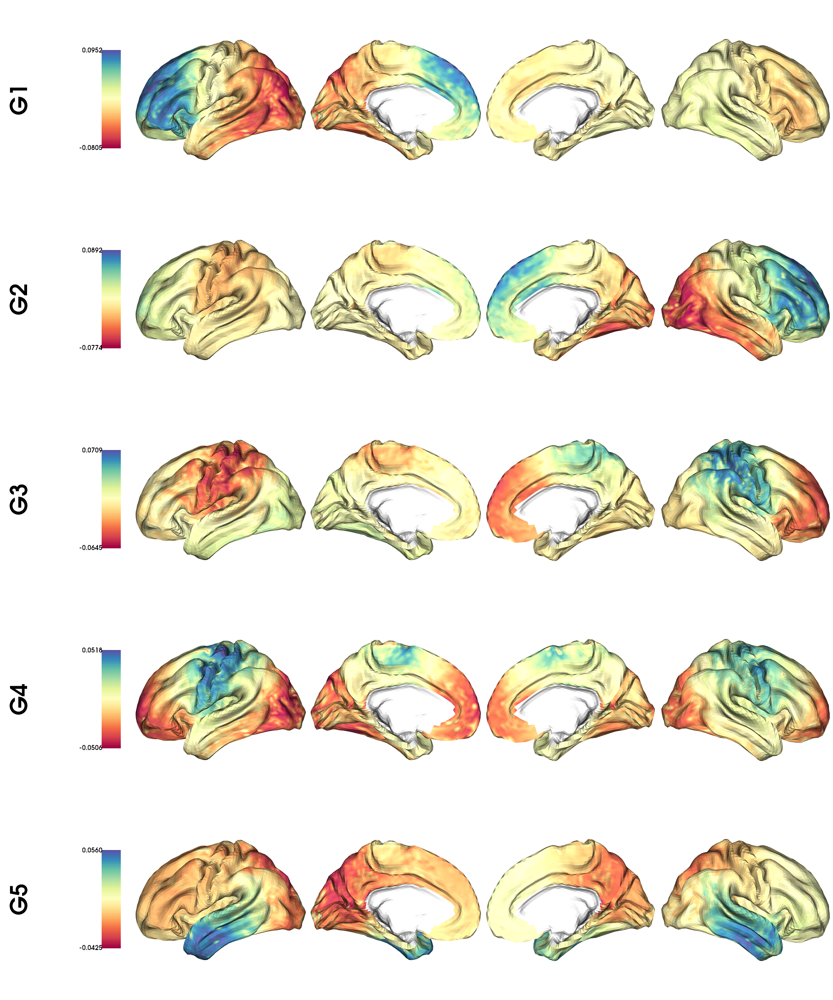

In [64]:
# Map gradients to original parcels
grad = [None] * N
for i, g in enumerate(SC_full.gradients_.T[0:N,:]):
    grad[i] = map_to_labels(g, labels_fsRL10k, fill=np.nan, mask=mask)

# Plot Gradients
labels=['G'+str(x) for x in list(range(1,N+1))]
plot_hemispheres(lh, rh, array_name=grad, size=(2000, 2400), cmap='Spectral',
                     embed_nb=True,  label_text={'left':labels}, color_bar='left',
                     zoom=1.25, nan_color=(1, 1, 1, 1), screenshot=False, filename='/home/bic/rcruces/Desktop/grad_100M_masked_full.png')


# Interhemispheric gradients

In [65]:
# Number of componetnts
N = 5

# SC Left hemi
SC_inter = GradientMaps(n_components=N, random_state=None, approach='dm', kernel='normalized_angle')
SC_inter.fit(SC_log[0:4428, 4428:8856], sparsity=0)

# SC Right hemi
SC_interR = GradientMaps(n_components=N, alignment='procrustes', kernel='normalized_angle'); # align right hemi to left hemi
SC_interR.fit(SC_log[4428:8856, 0:4428], sparsity=0, reference=SC_inter.gradients_)


GradientMaps(alignment='procrustes', kernel='normalized_angle', n_components=5)

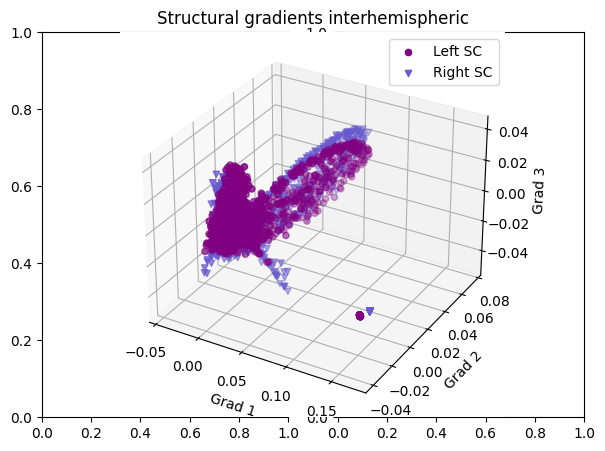

In [66]:
# plot the left gradients
g1=SC_inter.gradients_[:, 0]
g2=SC_inter.gradients_[:, 1]
g3=SC_inter.gradients_[:, 2]
# plot the right gradients
g1R=SC_interR.aligned_[:, 0]
g2R=SC_interR.aligned_[:, 1]
g3R=SC_interR.aligned_[:, 2]

# Creating figure
fig = plt.subplots(1, 2, figsize = (7, 5))
ax = plt.axes(projection ="3d")

# Creating plot
ax.scatter3D(g1, g2, g3, color = 'purple')
ax.scatter3D(g1R, g2R, g3R, color = 'slateblue', marker='v')
plt.title("Structural gradients interhemispheric")
ax.legend(['Left SC', 'Right SC'])
ax.set_xlabel('Grad 1')
ax.set_ylabel('Grad 2')
ax.set_zlabel('Grad 3')

# show plot
plt.show()

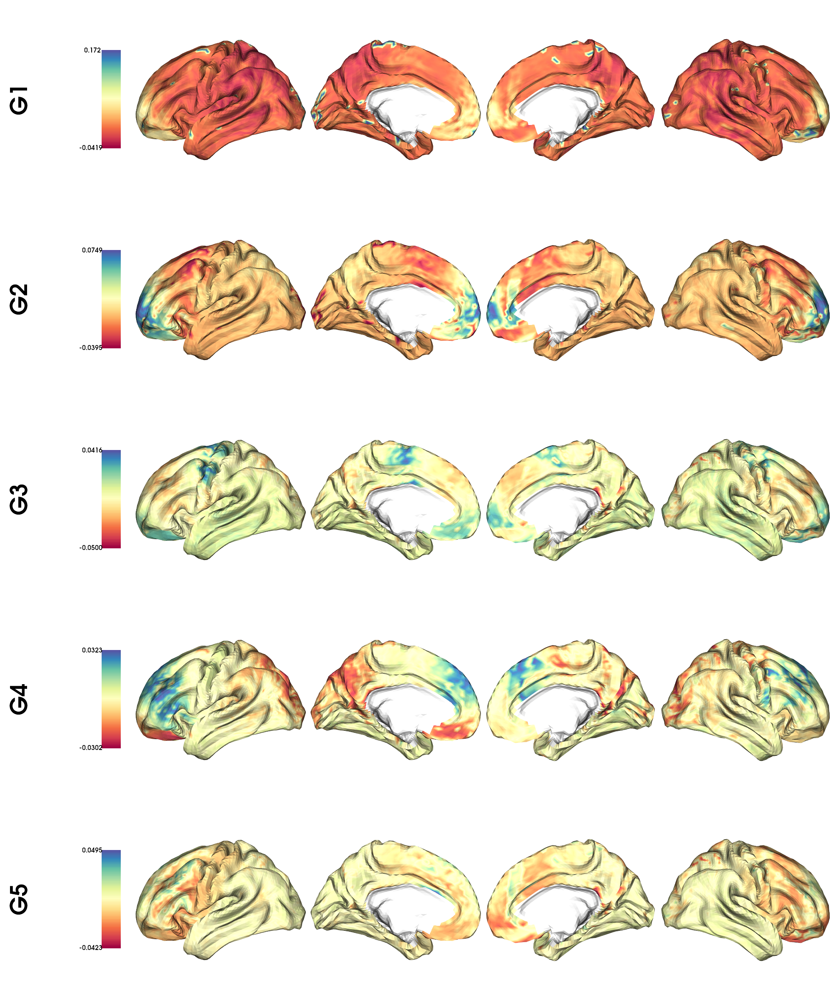

In [68]:
# Left and right gradients concatenated
SC_gradients = np.concatenate((SC_inter.gradients_, np.zeros((3, N)), SC_interR.aligned_), axis=0)

# Map gradients to original parcels
grad = [None] * N
for i, g in enumerate(SC_gradients.T[0:N,:]):
    grad[i] = map_to_labels(g, labels_fsRL10k, fill=np.nan, mask=mask)

# Plot Gradients
labels=['G'+str(x) for x in list(range(1,N+1))]
plot_hemispheres(lh, rh, array_name=grad, size=(2000, 2400), cmap='Spectral',
                     embed_nb=True,  label_text={'left':labels}, color_bar='left',
                     zoom=1.25, nan_color=(1, 1, 1, 1), screenshot=False, filename='/home/bic/rcruces/Desktop/grad_100M_masked.png')
